All credits go to [this notebook](https://www.kaggle.com/code/itsuki9180/rsna2024-lsdc-making-dataset/notebook#Export-png-from-dcm). Please comment if you see that I am incorrect about something. Thank you.

# Helpers

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import os
from tqdm import tqdm

import pydicom
import numpy as np

df_train_series_descriptions = pd.read_csv("/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv")
folder_train_images = os.listdir("/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images")
# exclude .DS_store files
folder_train_images = list(filter(lambda x: x.find('.DS') == -1, folder_train_images))

def get_metadata_object(folder_images, df_series_descriptions):
    '''
    for intially the train_images folder and train_series_descriptions.csv,
    later for the test_images folder and test_series_description.csv
    '''
    
    # a list of tuples like (study_id, study_id's path location)
    images_study_id_dirs = [(int(study_id),    # integer the study_id
                                   f"/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/{study_id}") 
                                  for study_id in folder_images]

    # convert the list of tuples into dictionary/metadata
    metadata_object = {study_id: {'study_id_folder_path': path, 
                                    'SeriesInstanceUIDs': [],
                                    'SeriesDescriptions': []
                                 }
                       for study_id, path in images_study_id_dirs
                      }

    # remove all the .DS files/folders (MacOS) from SeriesInstanceUIDs or series_ids folders
    # then put the names for series_ids as well as the corresponding description to metadata
    for study_id in tqdm(metadata_object):

        # SERIES_ID
        # get all series directories/folders inside each study_id directory
        series_ids_dirs = os.listdir(metadata_object[study_id]['study_id_folder_path'])
        filtered_series_ids_dirs = [int(x) for x in series_ids_dirs if x.find('.DS') == -1]   # integer(series_id)
        # put to metadata_object
        metadata_object[study_id]['SeriesInstanceUIDs'] = filtered_series_ids_dirs

        # SERIES_DESCRIPTIONS
        series_desc_df = df_series_descriptions[df_series_descriptions.study_id==study_id][["series_id", "series_description"]]
        for series_id in metadata_object[study_id]['SeriesInstanceUIDs']:

            series_desc_list = series_desc_df[series_desc_df.series_id==series_id].series_description.values

            if len(series_desc_list) == 0:
                metadata_object[study_id]['SeriesDescriptions'].append("")
            else:
                metadata_object[study_id]['SeriesDescriptions'].append(series_desc_list[0])
                
    return metadata_object


metadata_object_train = get_metadata_object(folder_train_images, df_train_series_descriptions)





def get_series_metadata_object_given_study_id(metadata_object, study_id):
    """
    one study_id can have many series => this func gets all series metadata for this 
    particular study_id
    """
    
    metadata_for_study_id = metadata_object[study_id]
    
    series_metadata_object_given_study_id = {}

    for idx, series_id in enumerate(metadata_for_study_id["SeriesInstanceUIDs"]):

        # create bases for the series_images_metadata: each series contains desc and images files
        series_metadata_object_given_study_id[series_id] = {'image_series_description': metadata_for_study_id["SeriesDescriptions"][idx], 
                                                            'image_files': []
                                                            }

        # glob for patten matching as we want to get image files ending with .dcm
        folder_path_study_id = metadata_for_study_id["study_id_folder_path"]
        # rmb: "SeriesInstancesUIDs" is just a list of images and series_id is the actual series-id
        image_files = glob(f"{folder_path_study_id}/{series_id}/*.dcm")


        # inside image_files, create a metadata for id_image and corresponding dicom readable image file
        sorted_image_files = sorted(image_files, key = lambda x: int(x.split('/')[-1].replace('.dcm', '')))

        
        # iterate through all image files (sorting to make sense, not very necessarily)
        for image_file in sorted_image_files:
            
            dicom_image_id = image_file.split('/')[-1].replace(".dcm", '')
            dicom_image_read = pydicom.dcmread(image_file)
            
            # metadata for one image instance
            one_image_metadata = {"SOPInstanceUID": dicom_image_id,      # id of the dicom image instance file
                                  "dicom_image_file": dicom_image_read}  # actual read of the dcm instance file

            # append this image_metadata to list of image_files
            series_metadata_object_given_study_id[series_id]["image_files"].append(one_image_metadata)

    return series_metadata_object_given_study_id
    
    
    
    
    
    
def display_images_given_study_id(metadata_object, study_id): 
    '''
    inside there is another function specifically for this function
    '''
    
    # view images for this study_id = 4003253 for a particular series_description
    def display_images(image_files, series_description, max_images_per_row=5):

        # grid for display
        num_images = len(image_files)
        num_rows = (num_images + max_images_per_row - 1) // max_images_per_row  # ceiling division (ignore the remainder, extra)

        # subplot grid
        fig, axes = plt.subplots(nrows=num_rows, ncols=max_images_per_row)

        # flatten axes for easy looping if there are multiple rows
        if num_rows > 1:
            axes = axes.flatten()
        else:
            axes = [axes] # iterable for consistency

        # plot each image
        for idx, image_file in enumerate(image_files):
            ax = axes[idx]
            ax.imshow(image_file, cmap='gray') # Assuming grayscale for simplicity, change cmap as needed
            ax.axis('off')

        # turn off unused subplots
        for idx in range(num_images, len(axes)):
            axes[idx].axis("off")

        fig.suptitle(series_description, fontsize=12)
        plt.show()
        
        
        
    series_metadata_object = get_series_metadata_object_given_study_id(metadata_object, study_id)
    
    for series_id in series_metadata_object:

        series_description = series_metadata_object[series_id]["image_series_description"]

        # get the image_files for this particular series_id
        image_files = series_metadata_object[series_id]["image_files"]

        # get the dicom files to a list
        dicom_images = []
        for image_metadata in image_files:
            dicom_image = image_metadata['dicom_image_file'].pixel_array
            dicom_images.append(dicom_image)

        # display images for each series
        display_images(dicom_images, series_description)
        
        

        
        
        
df_label_coord = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv')
# add the columns in coordinates regarding condition+level to match with train_df
cols = ['condition', 'level']
df_label_coord['m_condition'] = df_label_coord[cols].apply(lambda row: ' '.join(row.values.astype(str)).lower(), axis=1)
df_label_coord['m_condition'] = df_label_coord['m_condition'].str.replace(r'[ /]', '_', regex=True)

df_train = pd.read_csv('/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train.csv')



def display_images_with_coord(metadata_object, study_id):
    '''
    again, there is an inner function to display imges
    '''
    
    # this function is for one coord, one image, and one title/description/condition/level)
    def display_image_with_coord(center_coord, image_instance_dicom, title):
        '''
        coord_entry is a particular coord for a particular image 
        image_meta is the image that specifically in the series, containing SOPInstanceUID and dicom_image_file, i.e. 
        {2448190387: {'image_series_description': 'Axial T2',
                      'image_files': [{'SOPInstanceUID': '1',
                                        'dicom_image_file': Dataset.file_meta -------------------------------
                                        (0002, 0001) File Meta Informa
        '''
        radius = 10
        color = (255, 0, 0)
        thickness = 2

        # for what?
        image_normalized = cv2.normalize(image_instance_dicom, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        # circling
        image_circle = cv2.circle(image_normalized.copy(), center_coord, radius, color, thickness)

        # convert image from BGR to RGB for correct color display in matplotlib
        image_circle = cv2.cvtColor(image_circle, cv2.COLOR_BAYER_BG2BGR)

        # display
        plt.imshow(image_circle)
        plt.axis('off')
        plt.title(title)
        plt.show()
    
    
    
    # example_study_id = 4003253
    series_meta =  get_series_metadata_object_given_study_id(metadata_object, study_id) # series_meta all based on given study_id
    example_train_df = train_df[train_df.study_id==study_id]
    example_coord_entries_df = df_label_coord[df_label_coord.study_id==study_id]

    for d, coord_entry in example_coord_entries_df.iterrows():

        center_coord = (int(coord_entry['x']), int(coord_entry['y']))

        # search for the image available for coord in all imgs in series
        image_meta_instances_list = series_meta[coord_entry.series_id]["image_files"]
        # check matching
        image_instance_id = coord_entry.instance_number

        for image_instance in image_meta_instances_list:

            if int(image_instance["SOPInstanceUID"]) == int(image_instance_id):

                image_instance_dicom = image_instance["dicom_image_file"].pixel_array

                severity = train_df.loc[example_train_df.index[0], coord_entry.m_condition]
                title = f'image_instance_id: {image_instance_id} \n {coord_entry.m_condition} - severity: {severity}'

                display_image_with_coord(center_coord, image_instance_dicom, title)

100%|██████████| 1975/1975 [00:14<00:00, 136.89it/s]


# 1. Preparing

In [2]:
import pandas as pd
import numpy as np
import pydicom
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm
import re
import shutil
from glob import glob

In [3]:
df_train = pd.read_csv("/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train.csv")
df_train_series_descriptions = pd.read_csv("/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_series_descriptions.csv")
df_label_coord = pd.read_csv("/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_label_coordinates.csv")

Note that, most `study_id` has 3 series which correspond to 3 MRI scan type and also correspond to 3 conditions (without levels). Some has more Axial T2 than just one => consider all of these Axial T2 things as one for consistency.

# 2. Write dicom to png images, set new directory names too

### General structure of new image folder

train_images_png > study_id > [Axial_T2, Sagittal_T1, Sagittal_T2_STIR] > instance_ids of the images (in png)

Axial T2 images don't follow any order of imaging? => keep them as it aka not take any subset out of it. For the two Sagittal images, they seem to follow order so we can just take randomly 10 images at equal interval. Doing so helps with computational resources.

<br>

In [4]:
# collect main folder names (fixed and standard)

# unique study_id
study_ids = list(df_train.study_id.unique())
series_descs = list(df_train_series_descriptions.series_description.unique())
series_descs = list(map(lambda x: x.replace(' ', '_').replace('/','_'), series_descs))
print(study_ids[:5], ',... and more study_ids. And', series_descs)

[4003253, 4646740, 7143189, 8785691, 10728036] ,... and more study_ids. And ['Sagittal_T2_STIR', 'Sagittal_T1', 'Axial_T2']


In [5]:
def readdcm_writepng_image(src_dicom_pixelarray, dest_path_png):
    '''
    read image in dicom, then re-write it to png with my own construction of directories
    '''
    
    # standardize to 0 to 255 pixels range for saving purpose in png (1e-10 to avoid divided by 0)
    standardized_image_data = ((src_dicom_pixelarray - src_dicom_pixelarray.min()) / 
                               (src_dicom_pixelarray.max() - src_dicom_pixelarray.min() + 1e-10)) * 255
    
    # resize to 512 x 512 dimension (same to all images)
    final_image_to_png = cv2.resize(standardized_image_data, (512, 512),interpolation=cv2.INTER_CUBIC)
    
    # note:
    # 255 pixels represent intensity (contrast of the image) and 512x512 represent dimension
    
    # automatically write to new dest path with a png image when given a file path ended with".png"
    cv2.imwrite(dest_path_png, final_image_to_png)
    

In [6]:
# use my own metadata_object_train with other's to make dataset
main_path = '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/'
output_path = '/kaggle/working/train_images_png/'
np.random.seed(123)

# remove for fresh writing
if os.path.isdir(output_path):
    shutil.rmtree(output_path) 

for study_id in tqdm(metadata_object_train, total=len(metadata_object_train)):
     
    # series_metadata for this study_id
    metadata_series = get_series_metadata_object_given_study_id(metadata_object_train, study_id)
    
    # for zipped series_id and series_descriptions
    series_ids_list = metadata_object_train[study_id]["SeriesInstanceUIDs"]
    series_descs_list = metadata_object_train[study_id]["SeriesDescriptions"]
    series_descs_list = list(map(lambda x: x.replace(' ', '_').replace('/','_'), series_descs_list))
    
    for series_id, series_desc in zip(series_ids_list, series_descs_list):
        
        # make new folder for each series_desc for each study_id
        os.makedirs(f'{output_path}/{study_id}/{series_desc}', exist_ok=True)
        
        # get list of dicom images from this series
        images_dicom_list = metadata_series[series_id]["image_files"]
        len_images = len(images_dicom_list)
        
        if len_images==0:
            print(study_id, series_id, series_desc, 'has no images.')
            continue
        
        # Axial T2: write all and randomly subset for training later
        elif series_desc == 'Axial_T2':
        
            # convert these dicom images into png and write to new folder
            for metadata_image_dicom in images_dicom_list:
                image_filename = metadata_image_dicom["SOPInstanceUID"]
                image_dicom_pixelarray = metadata_image_dicom["dicom_image_file"].pixel_array

                dest_path = f'{output_path}/{study_id}/{series_desc}/{image_filename}.png'

                readdcm_writepng_image(image_dicom_pixelarray, dest_path)
                
        # Other two Sagittals: write 10 subset from the images at equal interval
        else:
            
            # determine intervals
            if len_images < 10:
                sampled_indices = np.arange(0, len_images)
            else: # other cases: 10 images, equal interval
                step_size = len_images // 10
                sampled_indices = np.arange(0, len_images, step_size)
                sampled_indices = np.random.choice(sampled_indices, size=10, replace=False)
                
                # more check for 10 images
                sampled_indices = sampled_indices[:10]

            # loop through indices in this list
            for idx in sampled_indices:
                
                metadata_image_dicom = images_dicom_list[int(idx)]
                
                image_filename = metadata_image_dicom["SOPInstanceUID"]
                image_dicom_pixelarray = metadata_image_dicom["dicom_image_file"].pixel_array

                dest_path = f'{output_path}/{study_id}/{series_desc}/{image_filename}.png'

                readdcm_writepng_image(image_dicom_pixelarray, dest_path)
            
            
            # check
            num_png_files = len(glob(f'{output_path}/{study_id}/{series_desc}/*.png'))
            if num_png_files > 10:
                print(study_id, series_id, series_desc, "has more than 10 images")
            assert 8 <= num_png_files <= 14, f'{len_images} got {num_png_files} images'

 24%|██▍       | 474/1975 [13:30<35:48,  1.43s/it]

2773343225 1143502064 Sagittal_T1 has more than 10 images


 30%|██▉       | 587/1975 [16:48<41:26,  1.79s/it]

2507107985 4115837782 Sagittal_T1 has more than 10 images


 32%|███▏      | 628/1975 [17:59<38:45,  1.73s/it]

1261271580 1629954928 Sagittal_T1 has more than 10 images


 38%|███▊      | 759/1975 [22:02<34:05,  1.68s/it]

2626030939 486328892 Sagittal_T1 has more than 10 images


 72%|███████▏  | 1421/1975 [41:10<11:37,  1.26s/it]

3109648055 1713175435 Sagittal_T1 has more than 10 images


 80%|███████▉  | 1571/1975 [45:26<13:15,  1.97s/it]

3387993595 1477805125 Sagittal_T1 has more than 10 images


100%|██████████| 1975/1975 [57:35<00:00,  1.75s/it]


# Mandatory checking output path

In [7]:
metadata_object_train[100206310]

{'study_id_folder_path': '/kaggle/input/rsna-2024-lumbar-spine-degenerative-classification/train_images/100206310',
 'SeriesInstanceUIDs': [1792451510, 1012284084, 2092806862],
 'SeriesDescriptions': ['Sagittal T2/STIR', 'Axial T2', 'Sagittal T1']}

Series description: Axial_T2


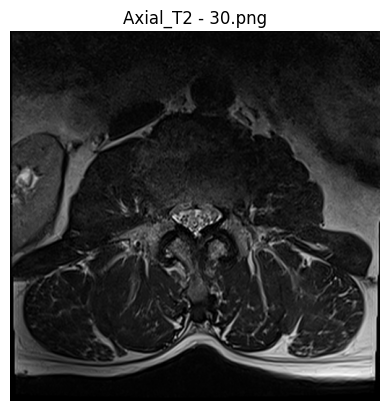

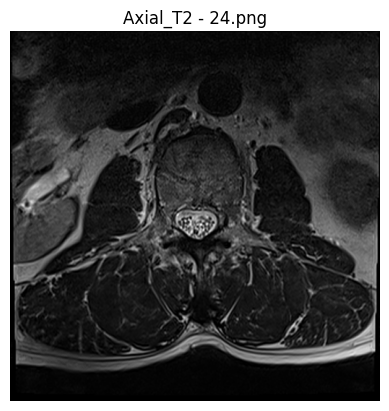

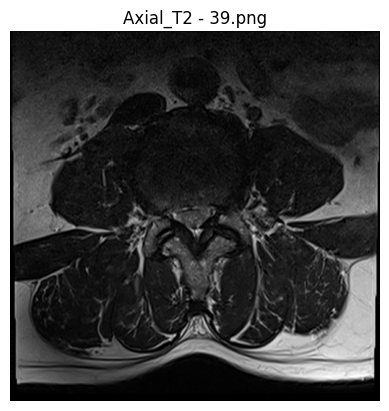

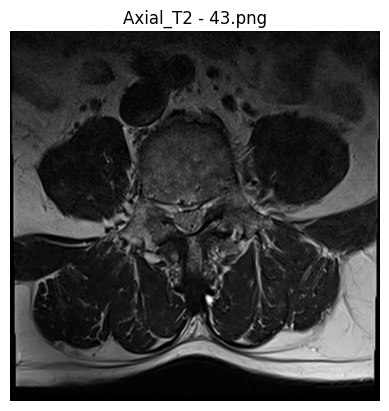

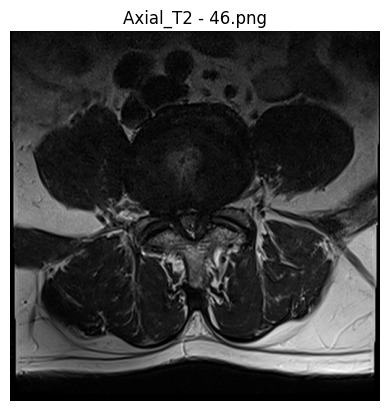

...

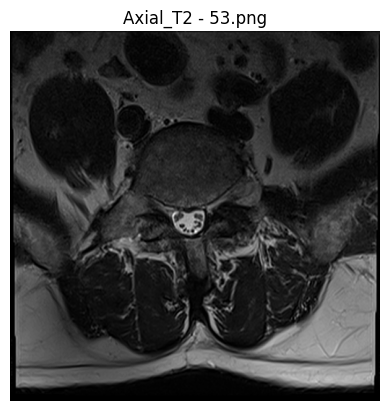

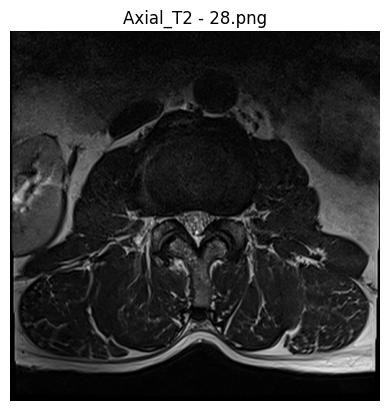

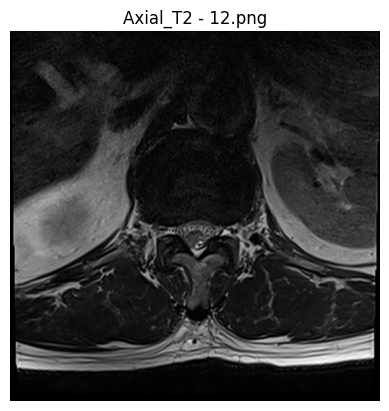

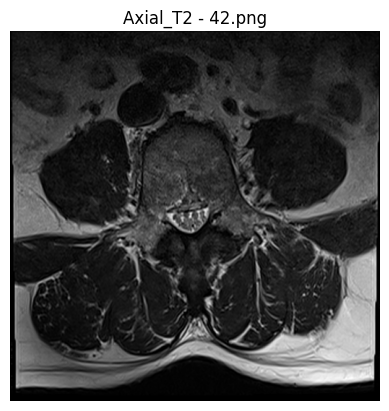

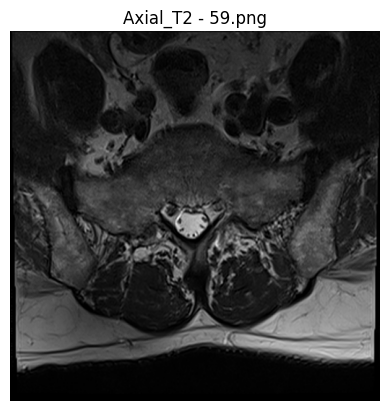

Series description: Sagittal_T2_STIR


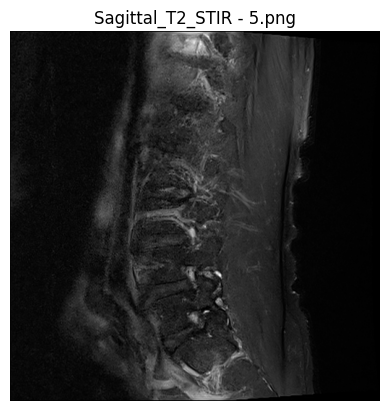

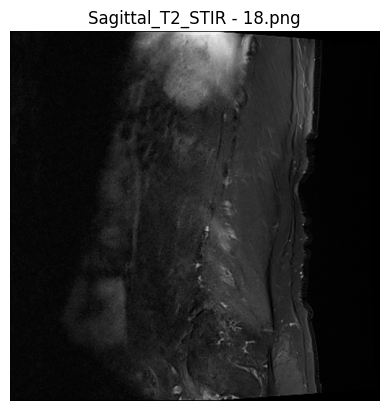

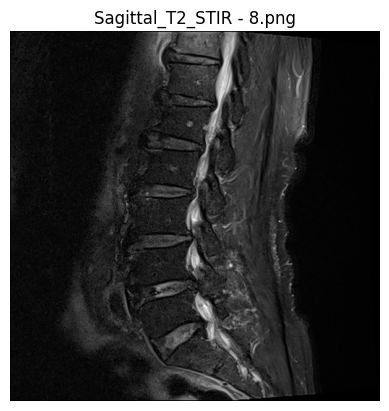

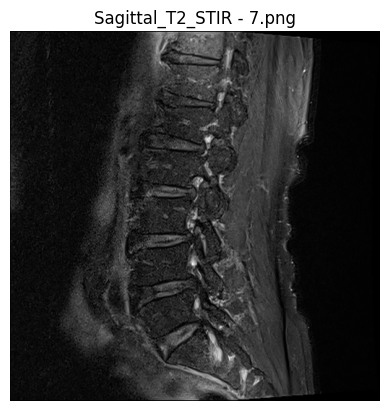

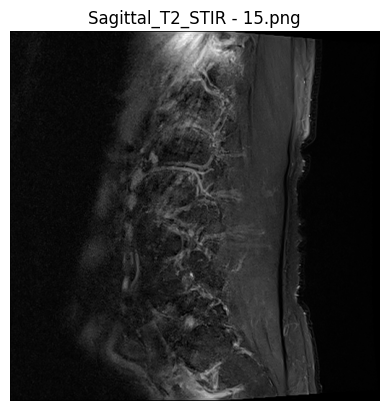

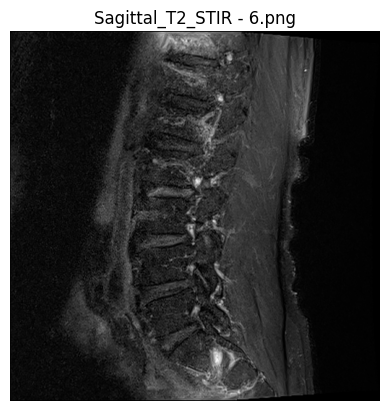

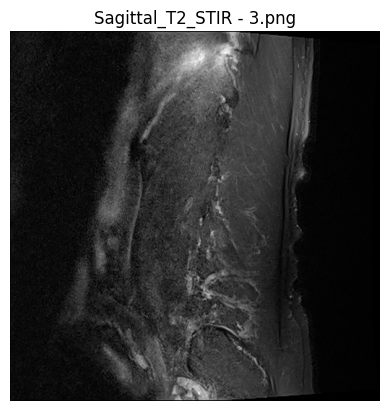

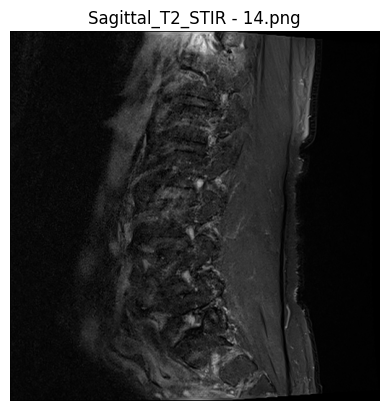

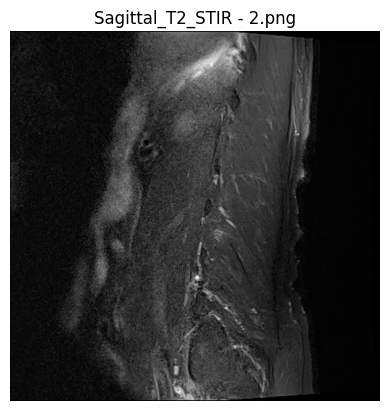

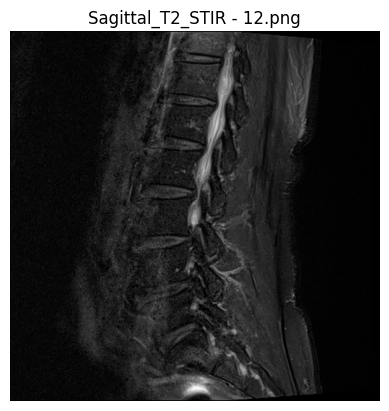

Series description: Sagittal_T1


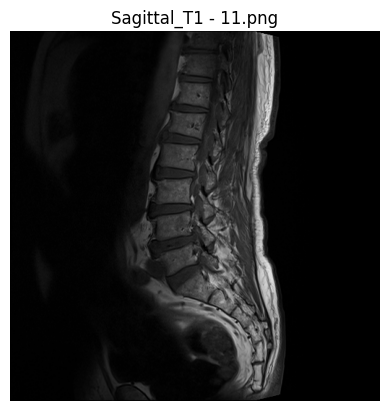

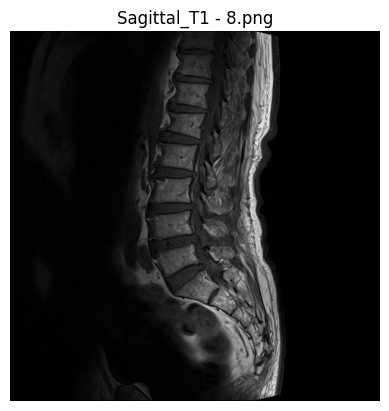

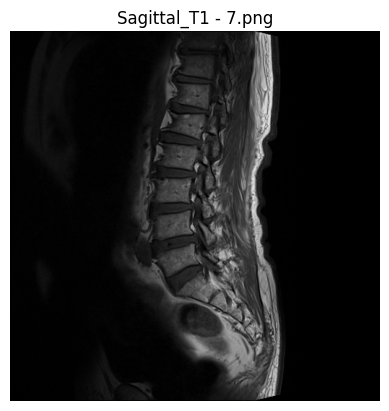

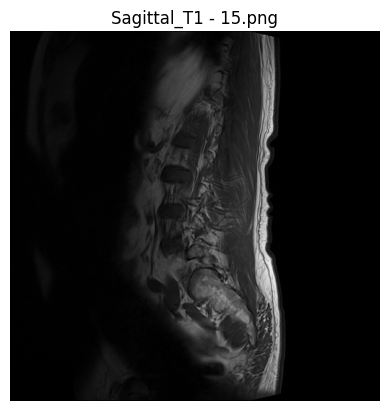

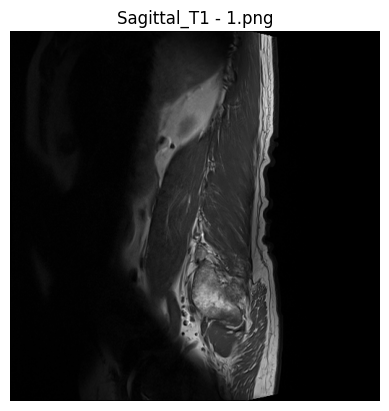

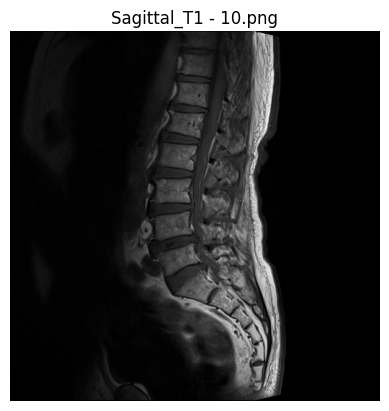

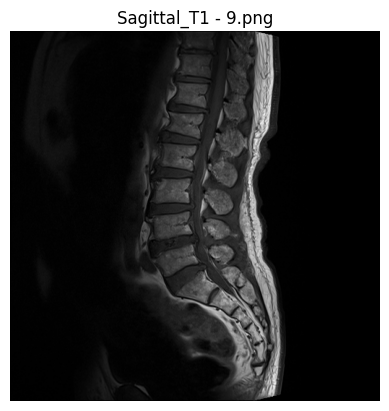

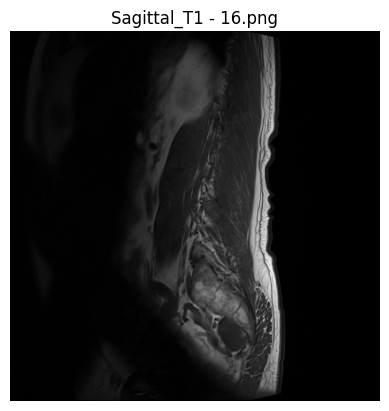

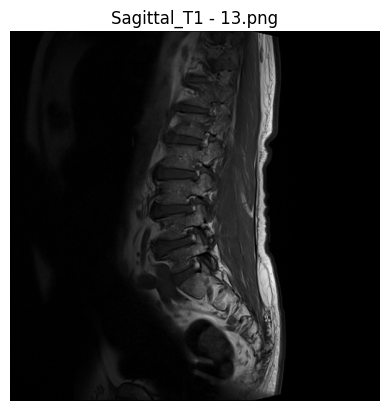

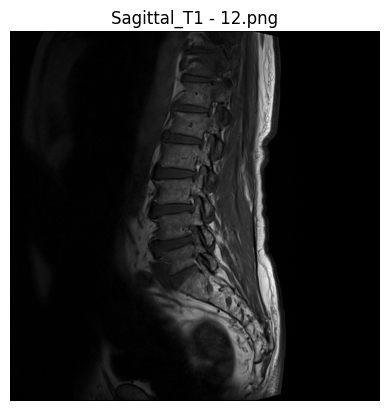

In [8]:
from PIL import Image
import matplotlib.pyplot as plt

output_path = '/kaggle/working/train_images_png'

study_id = 100206310
study_id_folder = f'{output_path}/{study_id}'

for series_desc in os.listdir(study_id_folder):
    
    print(f'Series description: {series_desc}')
    
    png_files = glob(f'{study_id_folder}/{series_desc}/*.png')
    
    for png_file in png_files:
       
        # Open and display the image
        img = Image.open(png_file)
        plt.imshow(img, cmap='gray')
        plt.title(f'{series_desc} - {os.path.basename(png_file)}')
        plt.axis('off')
        plt.show()
        